# Import libraries

In [2]:
import pickle
import glob
from pyscenic.rss import regulon_specificity_scores
from pyscenic.plotting import plot_rss
import matplotlib.pyplot as plt
from adjustText import adjust_text
import seaborn as sns
from pyscenic.binarization import binarize
from cytoolz import compose
import operator as op
from random import  sample
from arboreto.utils import load_tf_names
from arboreto.algo import grnboost2
from pyscenic.rnkdb import FeatherRankingDatabase as RankingDatabase
from pyscenic.utils import modules_from_adjacencies, load_motifs
from pyscenic.prune import prune2df, df2regulons
from pyscenic.aucell import aucell
from typing import Sequence, Type
from pyscenic.genesig import Regulon, GeneSignature, openfile
from re import search
import os
from dfply import *

# Load settings

In [3]:
if search("ricard", os.uname()[1]):
    exec(open('/Users/ricard/gastrulation_multiome_10x/settings.py').read())
    exec(open('/Users/ricard/gastrulation_multiome_10x/utils.py').read())
elif search("ebi", os.uname()[1]):
    exec(open('/homes/ricard/gastrulation_multiome_10x/settings.py').read())
    exec(open('/homes/ricard/gastrulation_multiome_10x/utils.py').read())
elif search("Workstation",os.uname()[1]):
    exec(open('/home/lijingyu/gastrulation/gastrulation_multiome_10x/utils.py').read())
    exec(open('/home/lijingyu/gastrulation/gastrulation_multiome_10x/settings.py').read())
else:
    exit("Computer not recognised")

## Define I/O

In [8]:
io["outdir"] = io["basedir"] + "/pyscenic"

## Define options 

In [9]:
# %%capture
# sc.settings.verbosity = 3
# sc.logging.print_versions()
sc.settings.set_figure_params(dpi=80, frameon=False, figsize=(8, 7), facecolor='white')

## Load cell metadata

In [11]:
metadata = (pd.read_table(io["metadata"]) >>
    mask(X.doublet_call==False, X["sample"].isin(opts["samples"]), X["celltype.mapped"].isin(opts["celltypes"]))
)

In [21]:
metadata.head()

,cell,sample,barcode,stage,nFeature_RNA,nCount_RNA,mitochondrial_percent_RNA,ribosomal_percent_RNA,pass_rnaQC,celltype.mapped,...,hybrid_score,doublet_call,TSSEnrichment_atac,ReadsInTSS_atac,PromoterRatio_atac,NucleosomeRatio_atac,nFrags_atac,BlacklistRatio_atac,pass_atacQC,celltype.predicted
10,E7.5_rep1#AAACATGCAGGATAAC-1,E7.5_rep1,AAACATGCAGGATAAC-1,E7.5,4157.0,11544.0,11.633749,5.621968,True,Blood_progenitors_1,...,0.243787,False,15.723,397.0,0.209673,2.081127,3608.0,0.017600,True,Blood_progenitors_1
22,E7.5_rep1#AAACCGGCAACCTAAT-1,E7.5_rep1,AAACCGGCAACCTAAT-1,E7.5,3407.0,8154.0,9.921511,5.469708,True,Haematoendothelial_progenitors,...,0.180916,False,12.705,3734.0,0.177365,1.672081,40800.0,0.016520,True,Haematoendothelial_progenitors
28,E7.5_rep1#AAACGCGCAGGAACAT-1,E7.5_rep1,AAACGCGCAGGAACAT-1,E7.5,4083.0,11181.0,18.942849,7.736338,True,Mixed_mesoderm,...,0.239001,False,11.931,4519.0,0.180515,1.290318,52943.0,0.018888,True,Mixed_mesoderm
43,E7.5_rep1#AAACGTACATGCTCCC-1,E7.5_rep1,AAACGTACATGCTCCC-1,E7.5,4095.0,10422.0,4.883899,5.200537,True,Blood_progenitors_2,...,0.112734,False,NaN,NaN,NaN,NaN,NaN,NaN,False,Blood_progenitors_2
54,E7.5_rep1#AAAGCACCATTTGCTC-1,E7.5_rep1,AAAGCACCATTTGCTC-1,E7.5,2769.0,4824.0,1.907131,5.825041,True,Blood_progenitors_1,...,0.128226,False,10.353,2703.0,0.172957,2.161860,34205.0,0.015173,True,Blood_progenitors_1


In [4]:
sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()
sc.set_figure_params(dpi=150, fontsize=10, dpi_save=600)

-----
anndata     0.7.5
scanpy      1.6.0
sinfo       0.3.1
-----
MulticoreTSNE       NA
PIL                 8.1.2
anndata             0.7.5
anyio               NA
argon2              20.1.0
attr                20.3.0
babel               2.9.0
backcall            0.2.0
bottleneck          1.3.2
brotli              NA
certifi             2020.12.05
cffi                1.14.5
chardet             4.0.0
cloudpickle         1.6.0
colorama            0.4.4
cycler              0.10.0
cython_runtime      NA
cytoolz             0.11.0
dask                2021.04.0
dateutil            2.8.1
decorator           5.0.7
deprecation         2.1.0
fsspec              0.9.0
get_version         2.1
h5py                3.1.0
idna                2.10
igraph              0.9.1
ipykernel           5.5.3
ipython_genutils    0.2.0
jedi                0.17.2
jinja2              2.11.3
joblib              1.0.1
json5               NA
jsonschema          3.2.0
jupyter_packaging   NA
jupyter_server      1.6.2
jup

In [5]:
adata = load_adata(io["anndata"])

In [6]:
adata

AnnData object with n_obs × n_vars = 36822 × 32245
    obs: 'sample', 'barcode', 'stage', 'nFeature_RNA', 'nCount_RNA', 'mitochondrial_percent_RNA', 'ribosomal_percent_RNA', 'pass_rnaQC', 'celltype.mapped', 'celltype.score', 'closest.cell', 'hybrid_score', 'doublet_call', 'TSSEnrichment_atac', 'ReadsInTSS_atac', 'PromoterRatio_atac', 'NucleosomeRatio_atac', 'nFrags_atac', 'BlacklistRatio_atac', 'pass_atacQC', 'celltype.predicted', 'sample_batch', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size'
    var: 'gene', 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    uns: 'celltype.mapped_colors', 'stage_colors'
    layers: 'spliced', 'unspliced'

In [10]:
# adata = adata[sample(list(adata.obs_names), 6000), :]

/home/lijingyu/anaconda3/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [44]:
adata = adata[~(adata.obs['celltype.mapped'].
                isin(['Parietal_endoderm', 'ExE_endoderm', 'ExE_ectoderm'])), ]

/home/lijingyu/anaconda3/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


# Run scanpy and pyscenic

## Data preprocessing

In [14]:
nCountsPerGene = np.sum(adata.X, axis=0)
nCellsPerGene = np.sum(adata.X > 0, axis=0)

# Show info
print("Number of counts (in the dataset units) per gene:",
      nCountsPerGene.min(), " - ", nCountsPerGene.max())
print("Number of cells in which each gene is detected:", nCellsPerGene.min(),
      " - ", nCellsPerGene.max())

nCells = adata.X.shape[0]

# pySCENIC thresholds
minCountsPerGene = 3 * .01 * nCells  # 3 counts in 1% of cells
print("minCountsPerGene: ", minCountsPerGene)

minSamples = .01 * nCells  # 1% of cells
print("minSamples: ", minSamples)

Number of counts (in the dataset units) per gene: 0.0  -  2298835.0
Number of cells in which each gene is detected: 0  -  6000
minCountsPerGene:  180.0
minSamples:  60.0


In [15]:
# simply compute the number of genes per cell (computers 'n_genes' column)
sc.pp.filter_cells(adata, min_genes=0)
# mito and genes/counts cuts
mito_genes = adata.var_names.str.startswith('mt-')
# for each cell compute fraction of counts in mito genes vs. all genes
adata.obs['percent_mito'] = np.sum(adata[:, mito_genes].X, axis=1) / np.sum(
    adata.X, axis=1)
# add the total counts per cell as observations-annotation to adata

adata.obs['n_counts'] = adata.X.sum(axis=1)

Trying to set attribute `.obs` of view, copying.
/home/lijingyu/anaconda3/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


/home/lijingyu/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='n_genes', ylabel='Density'>

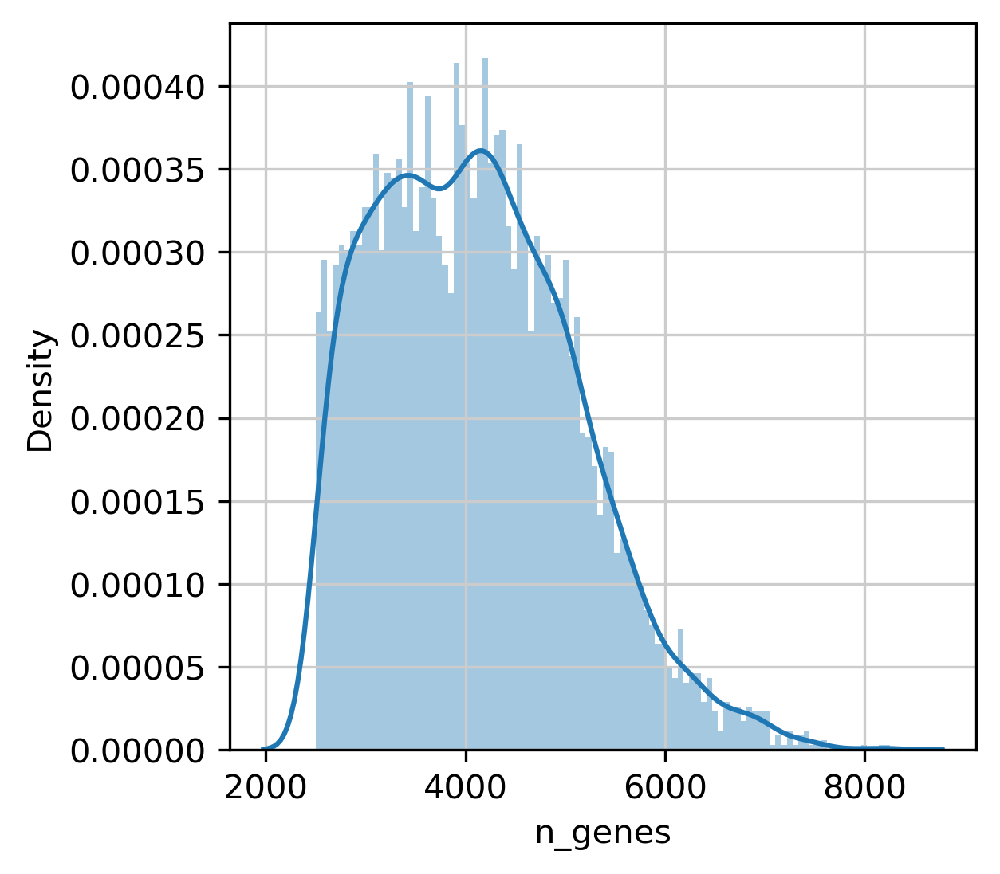

In [16]:
x = adata.obs['n_genes']
sns.distplot(x, norm_hist=True, bins=100)

In [17]:
 adata.obs.columns

Index(['sample', 'barcode', 'stage', 'nFeature_RNA', 'nCount_RNA',
       'mitochondrial_percent_RNA', 'ribosomal_percent_RNA', 'pass_rnaQC',
       'celltype.mapped', 'celltype.score', 'closest.cell', 'hybrid_score',
       'doublet_call', 'TSSEnrichment_atac', 'ReadsInTSS_atac',
       'PromoterRatio_atac', 'NucleosomeRatio_atac', 'nFrags_atac',
       'BlacklistRatio_atac', 'pass_atacQC', 'celltype.predicted',
       'sample_batch', 'initial_size_spliced', 'initial_size_unspliced',
       'initial_size', 'n_genes', 'percent_mito', 'n_counts'],
      dtype='object')

/home/lijingyu/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/home/lijingyu/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/home/lijingyu/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibili

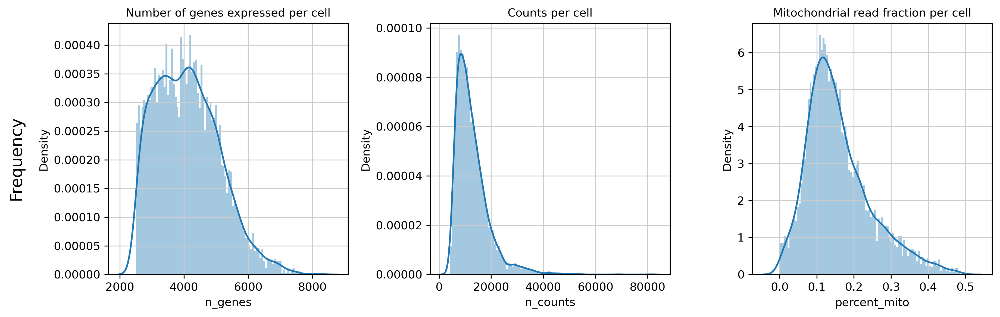

In [18]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12, 4), dpi=150, sharey=False)

sns.distplot( adata.obs['n_genes'], ax=ax1, norm_hist=True, bins=100)
sns.distplot( adata.obs['n_counts'], ax=ax2, norm_hist=True, bins=100)
sns.distplot( adata.obs['percent_mito'], ax=ax3, norm_hist=True, bins=100)

ax1.title.set_text('Number of genes expressed per cell')
ax2.title.set_text('Counts per cell')
ax3.title.set_text('Mitochondrial read fraction per cell')

fig.text(-0.01, 0.5, 'Frequency', ha='center', va='center', rotation='vertical', size='x-large')

fig.tight_layout()

fig.savefig('filtering_panel_prefilter.pdf', dpi=600, bbox_inches='tight')

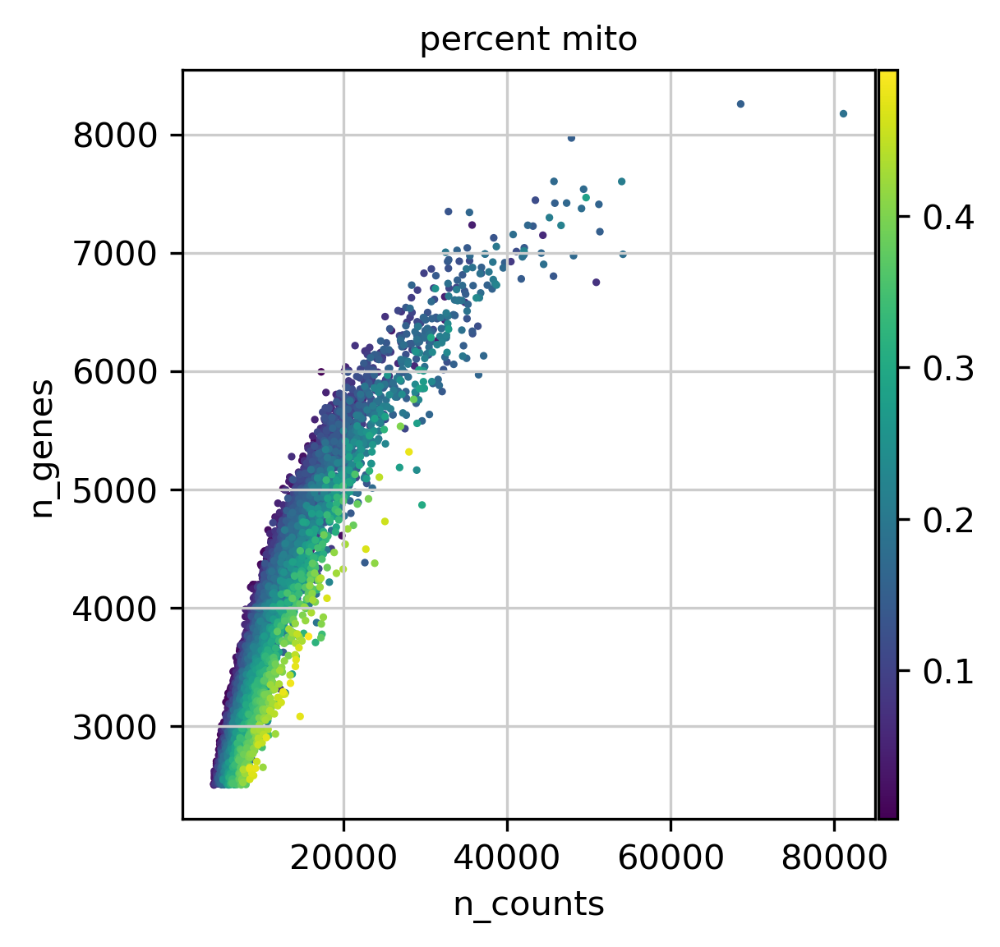

In [19]:
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='percent_mito')

### Carry out the filtering steps:

In [20]:
# initial cuts
sc.pp.filter_cells(adata, min_genes=200 )

/home/lijingyu/anaconda3/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [21]:
sc.pp.filter_genes(adata, min_cells=40 )

filtered out 15818 genes that are detected in less than 40 cells


In [22]:
adata

AnnData object with n_obs × n_vars = 6000 × 16427
    obs: 'sample', 'barcode', 'stage', 'nFeature_RNA', 'nCount_RNA', 'mitochondrial_percent_RNA', 'ribosomal_percent_RNA', 'pass_rnaQC', 'celltype.mapped', 'celltype.score', 'closest.cell', 'hybrid_score', 'doublet_call', 'TSSEnrichment_atac', 'ReadsInTSS_atac', 'PromoterRatio_atac', 'NucleosomeRatio_atac', 'nFrags_atac', 'BlacklistRatio_atac', 'pass_atacQC', 'celltype.predicted', 'sample_batch', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_genes', 'percent_mito', 'n_counts'
    var: 'gene', 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells'
    uns: 'celltype.mapped_colors', 'stage_colors'
    layers: 'spliced', 'unspliced'

### Diagnostic plots, post filtering

#### Three-panel summary plots

/home/lijingyu/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/home/lijingyu/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/home/lijingyu/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibili

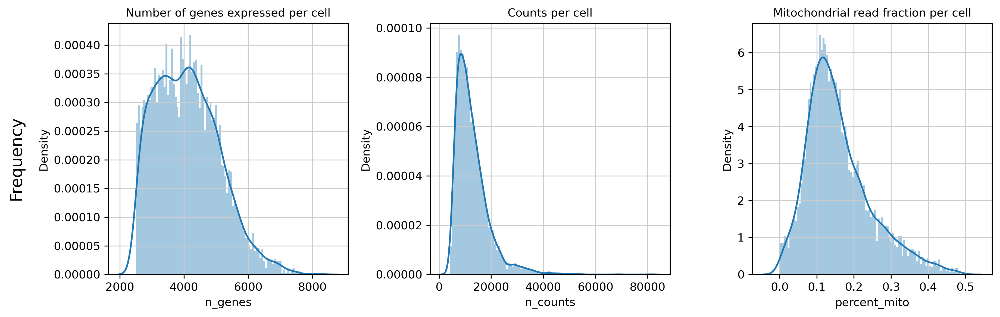

In [23]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12, 4), dpi=150, sharey=False)

adata.obs['n_genes']

sns.distplot( adata.obs['n_genes'], ax=ax1, norm_hist=True, bins=100)
sns.distplot( adata.obs['n_counts'], ax=ax2, norm_hist=True, bins=100)
sns.distplot( adata.obs['percent_mito'], ax=ax3, norm_hist=True, bins=100)

ax1.title.set_text('Number of genes expressed per cell')
ax2.title.set_text('Counts per cell')
ax3.title.set_text('Mitochondrial read fraction per cell')

fig.text(-0.01, 0.5, 'Frequency', ha='center', va='center', rotation='vertical', size='x-large')

fig.tight_layout()

fig.savefig('filtering_panel_postfilter.pdf', dpi=600, bbox_inches='tight')

#### Scatter plot, n_genes by n_counts

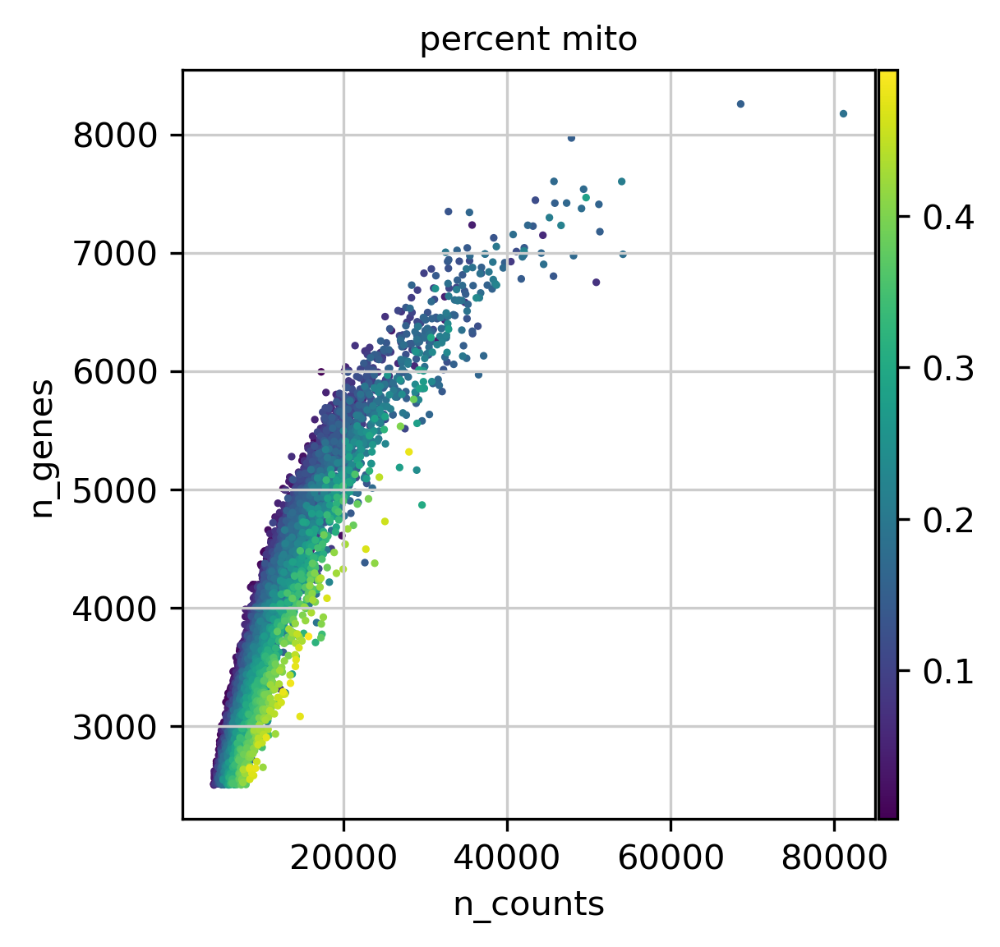

In [24]:
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='percent_mito')

## Further pre-processing of expression data

In [26]:
# save a copy of the raw data
# Total-count normalize (library-size correct) to 10,000 reads/cell
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)
# log transform the data.
sc.pp.log1p(adata)

# identify highly variable genes.

normalizing by total count per cell


/home/lijingyu/anaconda3/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


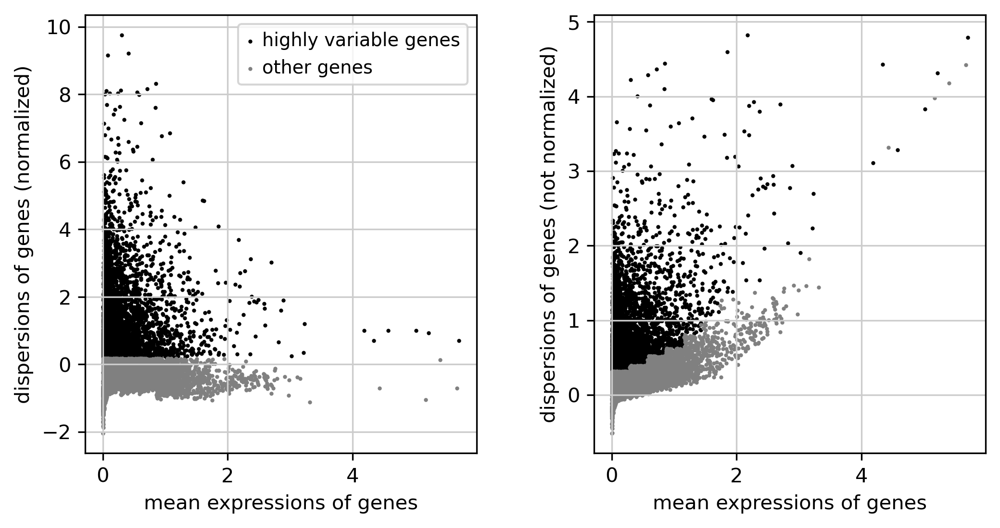

In [27]:
sc.pp.highly_variable_genes(adata,n_top_genes=4000)
sc.pl.highly_variable_genes(adata)

In [28]:
sum(adata.var['highly_variable'])

3999

In [29]:
# keep only highly variable genes:
adata = adata[:, adata.var['highly_variable']]

# regress out total counts per cell and the percentage of mitochondrial genes expressed
sc.pp.regress_out(adata, ['n_counts', 'n_genes', 'percent_mito'
                          ])  # n_jobs=args.threads , 'percent_mito'

# scale each gene to unit variance, clip values exceeding SD 10.
sc.pp.scale(adata, max_value=10)

# update the anndata file:

regressing out ['n_counts', 'n_genes', 'percent_mito']
    sparse input is densified and may lead to high memory use


/home/lijingyu/anaconda3/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


    finished (0:03:55)


### 1 PCA

In [31]:
# adata = sc.read_h5ad( f_anndata_path )
# principal component analysis
sc.tl.pca(adata, svd_solver='arpack')

/home/lijingyu/anaconda3/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


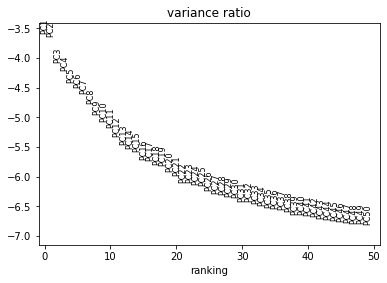

In [32]:
sc.pl.pca_variance_ratio(adata, log=True, n_pcs=50)

In [33]:
# neighborhood graph of cells (determine optimal number of PCs here)
sc.pp.neighbors(adata, n_pcs=40)

In [34]:
# compute UMAP
sc.tl.umap(adata)

In [35]:
# tSNE
sc.tl.tsne(adata, n_pcs=40)

### 3 Clustering

In [36]:
# cluster the neighbourhood graph
sc.tl.louvain(adata, resolution=0.5)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 14 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:00)


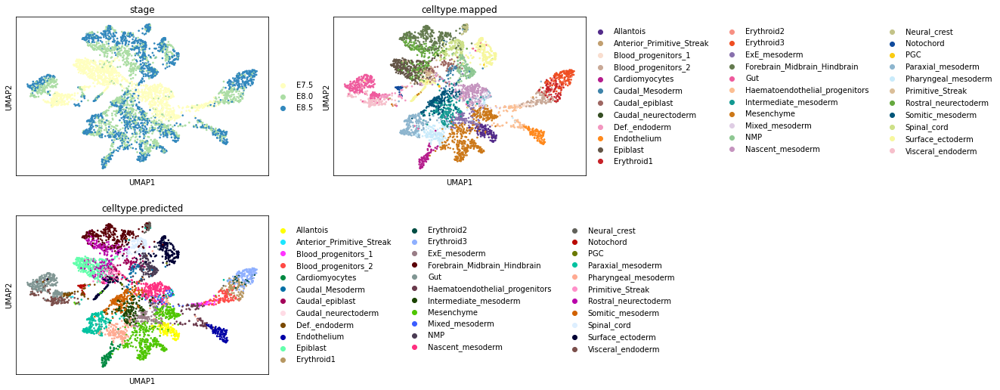

In [101]:
sc.pl.umap(adata,
           color=['stage', 'celltype.mapped', 'celltype.predicted'],
           ncols=2)

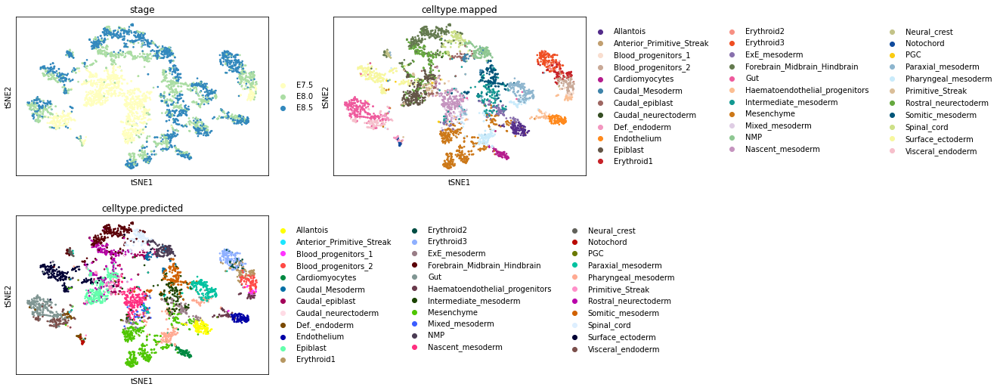

In [102]:
sc.pl.tsne(adata,
           color=['stage', 'celltype.mapped', 'celltype.predicted'],
           ncols=2)

## SCENIC steps

### STEP 1: Gene regulatory network inference, and generation of co-expression modules
#### Phase Ia: GRN inference using the GRNBoost2 algorithm

In [40]:
# transcription factors list
f_tfs = "/home/lijingyu/GRN/data/Ma2020/skin/pyscenic/resources/mm_mgi_tfs.txt"

In [42]:
tf_names = load_tf_names(f_tfs)

In [75]:
expr = pd.DataFrame(adata.X, columns=adata.var_names, index=adata.obs_names)

In [ ]:
adjacencies = grnboost2(expression_data=expr, tf_names=tf_names, verbose=True)

preparing dask client


/home/lijingyu/anaconda3/lib/python3.8/site-packages/distributed/node.py:151: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 35399 instead
  warnings.warn(


parsing input
creating dask graph
6 partitions
computing dask graph


In [71]:
adjacencies.head()

,TF,target,importance
0,Hspa5,Hsp90b1,366.647100
1,Hspa5,Calr,323.155078
2,Hspa5,Pdia6,291.784193
3,Kdm5d,Xist,251.851507
4,Hspa5,Ppib,251.360778


In [72]:
adjacencies.shape

(1123787, 3)

In [93]:
def add_correlation(adjacencies: pd.DataFrame,
                    ex_mtx: pd.DataFrame,
                    rho_threshold=0.03,
                    mask_dropouts=False) -> pd.DataFrame:
    print("Calculating Pearson correlations.")
    COLUMN_NAME_TARGET = "target"
    COLUMN_NAME_WEIGHT = "importance"
    COLUMN_NAME_REGULATION = "regulation"
    COLUMN_NAME_CORRELATION = "rho"
    COLUMN_NAME_TF = "TF"
    ex_mtx = ex_mtx.T[~ex_mtx.columns.duplicated(keep='first')].T.astype(float)
    assert rho_threshold > 0, "rho_threshold should be greater than 0."
    if mask_dropouts:
        ex_mtx = ex_mtx.sort_index(axis=1)
        col_idx_pairs = _create_idx_pairs(adjacencies, ex_mtx)
        rhos = masked_rho4pairs(ex_mtx.values, col_idx_pairs, 0.0)
    else:
        genes = list(
            set(adjacencies[COLUMN_NAME_TF]).union(
                set(adjacencies[COLUMN_NAME_TARGET])))
        ex_mtx = ex_mtx[ex_mtx.columns[ex_mtx.columns.isin(genes)]]
        corr_mtx = pd.DataFrame(index=ex_mtx.columns,
                                columns=ex_mtx.columns,
                                data=np.corrcoef(ex_mtx.values.T))
        rhos = np.array([
            corr_mtx[s2][s1]
            for s1, s2 in zip(adjacencies.TF, adjacencies.target)
        ])

    regulations = (rhos > rho_threshold).astype(int) - (
        rhos < -rho_threshold).astype(int)
    return pd.DataFrame(
        data={
            COLUMN_NAME_TF: adjacencies[COLUMN_NAME_TF].values,
            COLUMN_NAME_TARGET: adjacencies[COLUMN_NAME_TARGET].values,
            COLUMN_NAME_WEIGHT: adjacencies[COLUMN_NAME_WEIGHT].values,
            COLUMN_NAME_REGULATION: regulations,
            COLUMN_NAME_CORRELATION: rhos
        })

In [94]:
adj_add_cor = add_correlation(adjacencies, expr)

Calculating Pearson correlations.


In [100]:
adj_add_cor.head()

,TF,target,importance,regulation,rho
0,Hspa5,Hsp90b1,366.647100,1,0.699135
1,Hspa5,Calr,323.155078,1,0.663419
2,Hspa5,Pdia6,291.784193,1,0.631390
3,Kdm5d,Xist,251.851507,-1,-0.428594
4,Hspa5,Ppib,251.360778,1,0.536128


In [98]:
modules = list(modules_from_adjacencies(adj_add_cor, expr))


2021-04-28 04:54:13,749 - pyscenic.utils - INFO - Using existing Pearson correlations from the adjacencies file.

2021-04-28 04:54:13,769 - pyscenic.utils - INFO - Creating modules.


In [40]:
adj_add_cor.to_csv(os.path.join(io['outdir'],'auc_gastrulation_sub_add_cor_new.csv'))
#adjacencies = pd.read_csv('adj.csv', sep='\t')

In [ ]:
io['modules']=io['outdir']+"/module_gastrulation_sub_new.p"
with open(io['modules'], 'wb') as f:
    pickle.dump(modules, f)

### STEP 2-3: Regulon prediction aka cisTarget from CLI

In [42]:
DATABASE_FOLDER = "/home/lijingyu/GRN/data/Ma2020/skin/pyscenic"
DATABASES_GLOB = os.path.join(DATABASE_FOLDER, "mm10_*.mc9nr.feather")
MOTIF_ANNOTATIONS_FNAME=DATABASE_FOLDER+"/resources/motifs-v9-nr.mgi-m0.001-o0.0.tbl"

In [144]:
db_fnames = glob.glob(DATABASES_GLOB)

In [145]:
def name(fname):
    return os.path.splitext(os.path.basename(fname))[0]


dbs = [RankingDatabase(fname=fname, name=name(fname)) for fname in db_fnames]

In [147]:
list(dbs)

[FeatherRankingDatabase(name="mm10__refseq-r80__10kb_up_and_down_tss.mc9nr"),
 FeatherRankingDatabase(name="mm10__refseq-r80__500bp_up_and_100bp_down_tss.mc9nr")]

In [200]:
df = prune2df(dbs, modules,MOTIF_ANNOTATIONS_FNAME)

In [112]:
df.index

RangeIndex(start=0, stop=22982, step=1)

In [201]:
df.head()

Enrichment            \
                                              AUC       NES   
TF   MotifID                                                  
Atf3 transfac_pro__M08931                0.099951  3.189657   
     dbcorrdb__JUN__ENCSR000EGH_1__m1    0.097347  3.006380   
     dbcorrdb__BCL3__ENCSR000BQH_1__m2   0.098516  3.088644   
     cisbp__M5050                        0.102169  3.345769   
     yetfasco__YEL009C_1363              0.102705  3.383457   

                                                              \
                                       MotifSimilarityQvalue   
TF   MotifID                                                   
Atf3 transfac_pro__M08931                           0.000226   
     dbcorrdb__JUN__ENCSR000EGH_1__m1               0.000773   
     dbcorrdb__BCL3__ENCSR000BQH_1__m2              0.000006   
     cisbp__M5050                                   0.000608   
     yetfasco__YEL009C_1363                         0.000274   

                                                            \
                                       OrthologousIdentity   
TF   MotifID                                                 
Atf3 transfac_pro__M08931                              1.0   
     dbcorrdb__JUN__ENCSR000EGH_1__m1                  1.0   
     dbcorrdb__BCL3__ENCSR000BQH_1__m2                 1.0   
     cisbp__M5050                                      1.0   
     yetfasco__YEL009C_1363                            1.0   

                                                                                           \
                                                                               Annotation   
TF   MotifID                                                                                
Atf3 transfac_pro__M08931               gene is annotated for similar motif hocomoco__...   
     dbcorrdb__JUN__ENCSR000EGH_1__m1   gene is annotated for similar motif hocomoco__...   
     dbcorrdb__BCL3__ENCSR000BQH_1__m2  gene is annotated for similar motif hocomoco__...   
     cisbp__M5050                       gene is annotated for similar motif hocomoco__...   
     yetfasco__YEL009C_1363             gene is annotated for similar motif hocomoco__...   

                                                                                           \
                                                                                  Context   
TF   MotifID                                                                                
Atf3 transfac_pro__M08931               (weight>75.0%, mm10__refseq-r80__10kb_up_and_d...   
     dbcorrdb__JUN__ENCSR000EGH_1__m1   (weight>75.0%, mm10__refseq-r80__10kb_up_and_d...   
     dbcorrdb__BCL3__ENCSR000BQH_1__m2  (weight>75.0%, mm10__refseq-r80__10kb_up_and_d...   
     cisbp__M5050                       (weight>75.0%, mm10__refseq-r80__10kb_up_and_d...   
     yetfasco__YEL009C_1363             (weight>75.0%, mm10__refseq-r80__10kb_up_and_d...   

                                                                                           \
                                                                              TargetGenes   
TF   MotifID                                                                                
Atf3 transfac_pro__M08931               [(Junb, 5.977495469772545), (Anxa1, 26.2102149...   
     dbcorrdb__JUN__ENCSR000EGH_1__m1   [(Lmna, 10.261924275120547), (Itpkc, 4.0592702...   
     dbcorrdb__BCL3__ENCSR000BQH_1__m2  [(Itpkc, 4.059270276128117), (Ptp4a2, 1.067807...   
     cisbp__M5050                       [(Lmna, 10.261924275120547), (Anxa1, 26.210214...   
     yetfasco__YEL009C_1363             [(Junb, 5.977495469772545), (Lmna, 10.26192427...   

                                                  
                                       RankAtMax  
TF   MotifID                                      
Atf3 transfac_pro__M08931                    304  
     dbcorrdb__JUN__ENCSR000EGH_1__m1        213  
     dbcorrdb__BCL3__ENCSR000BQH_1

In [202]:
io['pruned_motif']=io['outdir']+"/pruned_motif_gas_sub_new.csv"
df.to_csv(io['pruned_motif'])
# df_motifs = load_motifs('pruned_motif_ma20.csv')

In [130]:
def derive_regulons(
    motifs,
    db_names=('mm10__refseq-r80__10kb_up_and_down_tss.mc9nr',
              'mm10__refseq-r80__500bp_up_and_100bp_down_tss.mc9nr')):
    def contains(*elems):
        def f(context):
            return any(elem in context for elem in elems)

        return f

    # For the creation of regulons we only keep the 10-species databases and the activating modules. We also remove the
    # enriched motifs for the modules that were created using the method 'weight>50.0%' (because these modules are not part
    # of the default settings of modules_from_adjacencies anymore.
    motifs = motifs[
        np.fromiter(map(compose(op.not_, contains('weight>50.0%')), motifs.iloc[:,5]), dtype=np.bool) & \
        np.fromiter(map(contains(*db_names),motifs.iloc[:,5]), dtype=np.bool) & \
        np.fromiter(map(contains('activating'), motifs.iloc[:,5]), dtype=np.bool)]

    # We build regulons only using enriched motifs with a NES of 3.0 or higher; we take only directly annotated TFs or TF annotated
    # for an orthologous gene into account; and we only keep regulons with at least 10 genes.
    regulons = list(
        filter(
            lambda r: len(r) >= 10,
            df2regulons(motifs[
                (motifs.iloc[:, 1] >= 3.0)
                & ((motifs.iloc[:, 4] == 'gene is directly annotated')
                   |
                   (motifs.iloc[:, 4].str.startswith('gene is orthologous to')
                    & motifs.iloc[:, 4].str.endswith(
                        'which is directly annotated for motif')))])))

    # Rename regulons, i.e. remove suffix.
    return list(map(lambda r: r.rename(r.transcription_factor), regulons))

In [149]:
regulons = derive_regulons(
    df,
    db_names=('mm10__refseq-r80__10kb_up_and_down_tss.mc9nr',
              'mm10__refseq-r80__500bp_up_and_100bp_down_tss.mc9nr'))

<ipython-input-130-aecf8ed32075>:11: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  np.fromiter(map(compose(op.not_, contains('weight>50.0%')), motifs.iloc[:,5]), dtype=np.bool) & \
<ipython-input-130-aecf8ed32075>:12: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  np.fromiter(map(contains(*db_names),motifs.iloc[:,5]), dtype=np.bool) & \
<ipython-inp

Create regulons from a dataframe of enriched features.
Additional columns saved: []


In [ ]:
io['regulons']=io['outdir']+'/regulons_gastrulation_sub_new.p'

with open(io['regulons'], 'wb') as f:
    pickle.dump(regulons, f)

### STEP 4: Cellular enrichment (aka AUCell) from CLI

It is important to check that most cells have a substantial fraction of expressed/detected genes in the calculation of the AUC.
The following histogram gives an idea of the distribution and allows selection of an appropriate threshold.

See [the relevant section in the R tutorial](https://bioconductor.org/packages/devel/bioc/vignettes/AUCell/inst/doc/AUCell.html#build-gene-expression-rankings-for-each-cell) for more information.

By using the default setting for `--auc_threshold` of `0.05`, we see that **1192** genes are selected for the rankings based on the plot below.

In [10]:
nGenesDetectedPerCell = np.sum(adata.X > 0, axis=1)

/home/lijingyu/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:>

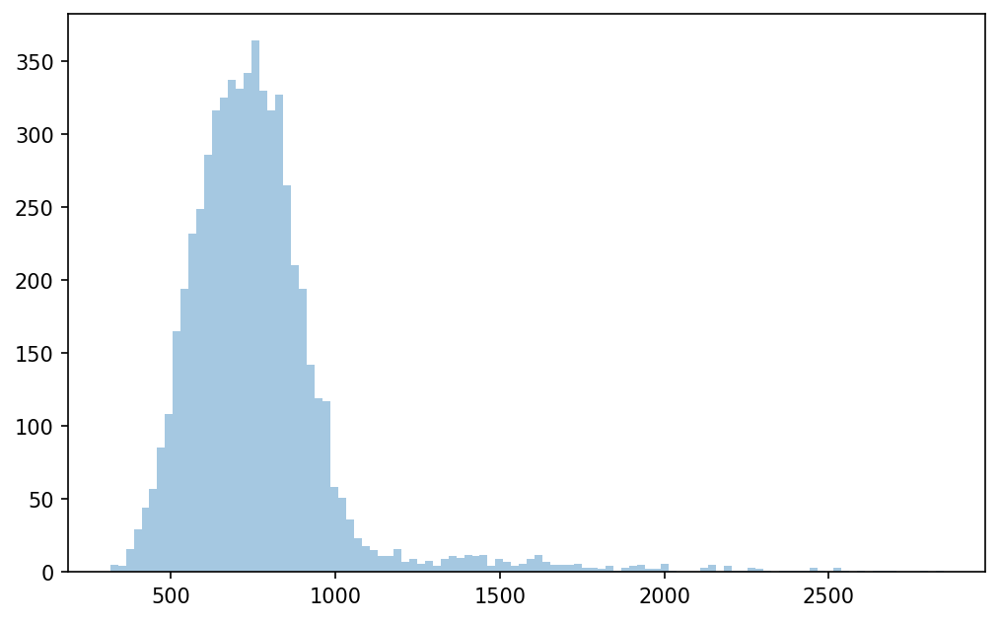

In [19]:
fig, ax = plt.subplots(1, 1, figsize=(8, 5), dpi=150)
sns.distplot(nGenesDetectedPerCell, norm_hist=False, kde=False, bins='fd')

In [224]:
auc_mtx = aucell(expr, regulons, num_workers=1, auc_threshold=0.45)  # 0.4

100%|██████████| 105/105 [00:05<00:00, 20.00it/s]


/home/lijingyu/anaconda3/lib/python3.8/site-packages/seaborn/matrix.py:649: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


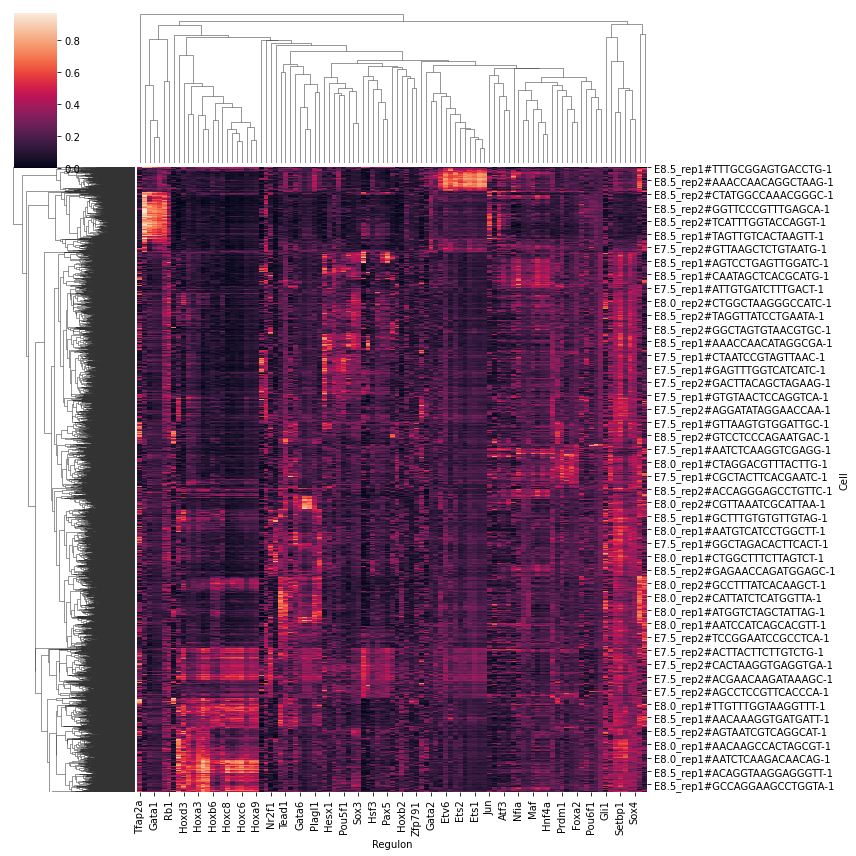

In [227]:
sns.clustermap(auc_mtx, figsize=(12, 12))

In [230]:
auc_mtx

Regulon,Adarb1,Ar,Arid3a,Arnt,Atf1,Atf3,Atf6,Cbx3,Cebpg,Chd2,...,Tfdp1,Thrb,Ybx1,Yy1,Zbtb33,Zeb1,Zfp143,Zfp362,Zfp445,Zfp64
Cell,,,,,,,,,,,,,,,,,,,,,
"R1.01,R2.04,R3.61,P1.05",0.077049,0.125810,0.329808,0.069308,0.311006,0.366236,0.462464,0.080839,0.081691,0.179541,...,0.196507,0.142432,0.072694,0.083422,0.065057,0.000000,0.194906,0.177374,0.130661,0.310036
"R1.01,R2.05,R3.15,P1.05",0.213918,0.374088,0.088630,0.250226,0.068697,0.384008,0.467874,0.278662,0.123279,0.186250,...,0.123369,0.230533,0.221428,0.155587,0.161984,0.729883,0.114993,0.298849,0.508928,0.234403
"R1.01,R2.09,R3.17,P1.06",0.109375,0.255213,0.227487,0.273223,0.127133,0.312633,0.305013,0.053491,0.190354,0.067206,...,0.130218,0.348896,0.111243,0.087327,0.122464,0.265233,0.095293,0.206916,0.337198,0.111558
"R1.01,R2.10,R3.85,P1.05",0.381064,0.240343,0.259217,0.096058,0.053139,0.112717,0.111272,0.053995,0.361222,0.140618,...,0.097329,0.353519,0.148620,0.114509,0.120891,0.222740,0.115417,0.173732,0.044550,0.101172
"R1.01,R2.11,R3.27,P1.06",0.001194,0.100792,0.218144,0.087674,0.196065,0.321052,0.273805,0.076073,0.095226,0.216845,...,0.129452,0.185535,0.069854,0.193763,0.089130,0.705061,0.193437,0.251926,0.400257,0.381636
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
"R1.96,R2.78,R3.25,P1.06",0.168226,0.198882,0.525930,0.166724,0.031992,0.110183,0.129250,0.052177,0.225153,0.128007,...,0.101107,0.387969,0.145915,0.110489,0.138841,0.119323,0.223308,0.147186,0.050512,0.317682
"R1.96,R2.79,R3.39,P1.07",0.169926,0.095383,0.168400,0.129922,0.146904,0.321220,0.258144,0.043437,0.112402,0.161869,...,0.097708,0.259893,0.103115,0.158916,0.081284,0.007750,0.184356,0.153663,0.118561,0.097385
"R1.96,R2.85,R3.55,P1.06",0.168797,0.143543,0.216558,0.186440,0.178858,0.185936,0.303650,0.052440,0.178937,0.104984,...,0.210421,0.301194,0.149619,0.185862,0.136087,0.075133,0.149864,0.188274,0.113760,0.106995


In [43]:
io['auc']=io['outdir']+"/auc_gastrulation_sub_new.csv"

In [21]:
auc_mtx.to_csv(io['auc'])

# Integrate scenic results with scanpy

In [22]:
def add_scenic_metadata(adata: 'sc.AnnData',
                        auc_mtx: pd.DataFrame,
                        regulons,
                        bin_rep: bool = False,
                        copy: bool = False) -> 'sc.AnnData':
    """
    Add AUCell values and regulon metadata to AnnData object.
    :param adata: The AnnData object.
    :param auc_mtx: The dataframe containing the AUCell values (#observations x #regulons).
    :param bin_rep: Also add binarized version of AUCell values as separate representation. This representation
    is stored as `adata.obsm['X_aucell_bin']`.
    :param copy: Return a copy instead of writing to adata.
    :
    """
    # To avoid dependency with scanpy package the type hinting intentionally uses string literals.
    # In addition, the assert statement to assess runtime type is also commented out.
    #assert isinstance(adata, sc.AnnData)
    assert isinstance(auc_mtx, pd.DataFrame)
    assert len(auc_mtx) == adata.n_obs

    REGULON_SUFFIX_PATTERN = 'Regulon({})'

    result = adata.copy() if copy else adata

    # Add AUCell values as new representation (similar to a PCA). This facilitates the usage of
    # AUCell as initial dimensional reduction.
    result.obsm['X_aucell'] = auc_mtx.values.copy()
    if bin_rep:
        bin_mtx, _ = binarize(auc_mtx)
        result.obsm['X_aucell_bin'] = bin_mtx.values

    # Encode genes in regulons as "binary" membership matrix.
    if regulons is not None:
        genes = np.array(adata.var_names)
        data = np.zeros(shape=(adata.n_vars, len(regulons)), dtype=bool)
        for idx, regulon in enumerate(regulons):
            data[:, idx] = np.isin(genes, regulon.genes).astype(bool)
        regulon_assignment = pd.DataFrame(
            data=data,
            index=genes,
            columns=list(
                map(lambda r: REGULON_SUFFIX_PATTERN.format(r.name),
                    regulons)))
        result.var = pd.merge(result.var,
                              regulon_assignment,
                              left_index=True,
                              right_index=True,
                              how='left')

    # Add additional meta-data/information on the regulons.
    def fetch_logo(context):
        for elem in context:
            if elem.endswith('.png'):
                return elem
        return ""

    result.uns['aucell'] = {
        'regulon_names':
        auc_mtx.columns.map(lambda s: REGULON_SUFFIX_PATTERN.format(s)).values,
        'regulon_motifs':
        np.array([fetch_logo(reg.context)
                  for reg in regulons] if regulons is not None else [])
    }

    # Add the AUCell values also as annotations of observations. This way regulon activity can be
    # depicted on cellular scatterplots.
    mtx = auc_mtx.copy()
    mtx.columns = result.uns['aucell']['regulon_names']
    result.obs = pd.merge(result.obs,
                          mtx,
                          left_index=True,
                          right_index=True,
                          how='left')

    return result

In [23]:
atada = add_scenic_metadata(adata, auc_mtx, regulons)

In [17]:
tsne=sc.tl.tsne(adata, use_rep='X_aucell',copy=True)

In [18]:
adata.obsm['X_tsne_aucell']= tsne.obsm['X_tsne']

In [19]:
sc.pp.neighbors(adata,key_added='neighbors_aucell',use_rep='X_aucell')

/home/lijingyu/anaconda3/lib/python3.8/site-packages/sklearn/metrics/pairwise.py:56: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  dtype = np.float
/home/lijingyu/anaconda3/lib/python3.8/site-packages/sklearn/metrics/pairwise.py:56: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  dtype = np.float


In [20]:
umap=sc.tl.umap(adata, neighbors_key='neighbors_aucell',copy=True)

In [21]:
adata.obsm['X_umap_aucell']=umap.obsm['X_umap']

In [22]:
sc.tl.louvain(adata,key_added='louvain_aucell',neighbors_key='neighbors_aucell',resolution=0.35)

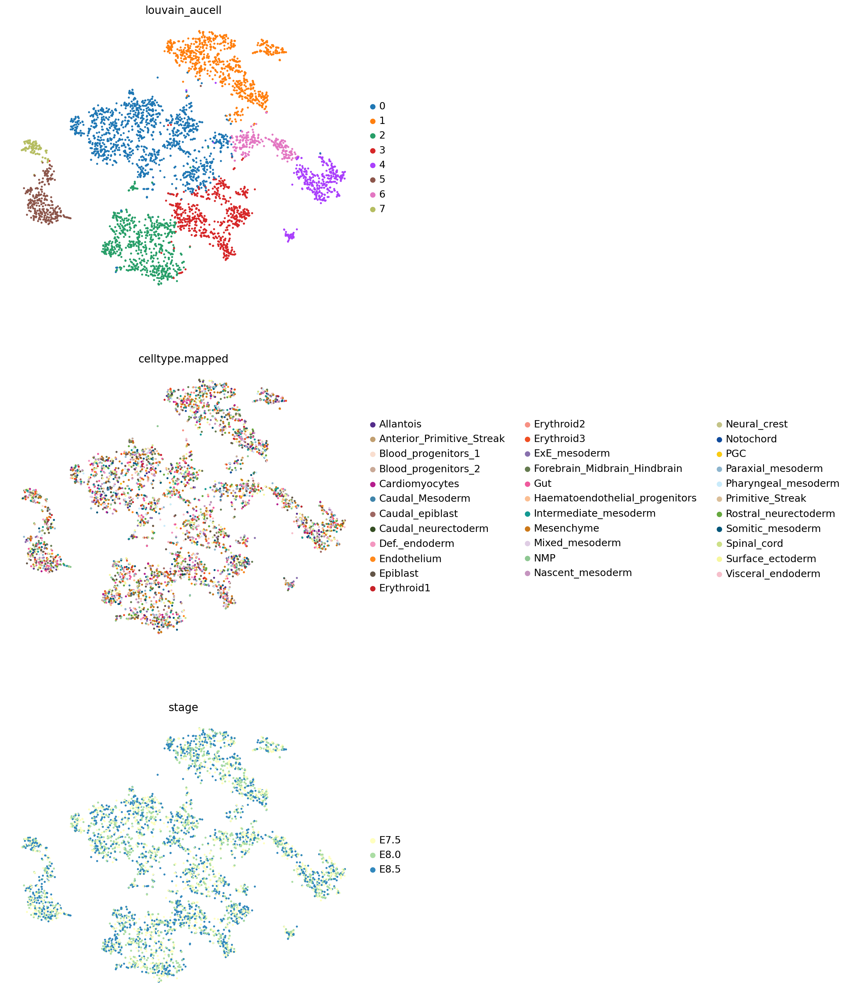

In [26]:
sc.pl.embedding(adata,basis='X_tsne_aucell', color=['louvain_aucell','celltype.mapped','stage'],ncols=1)

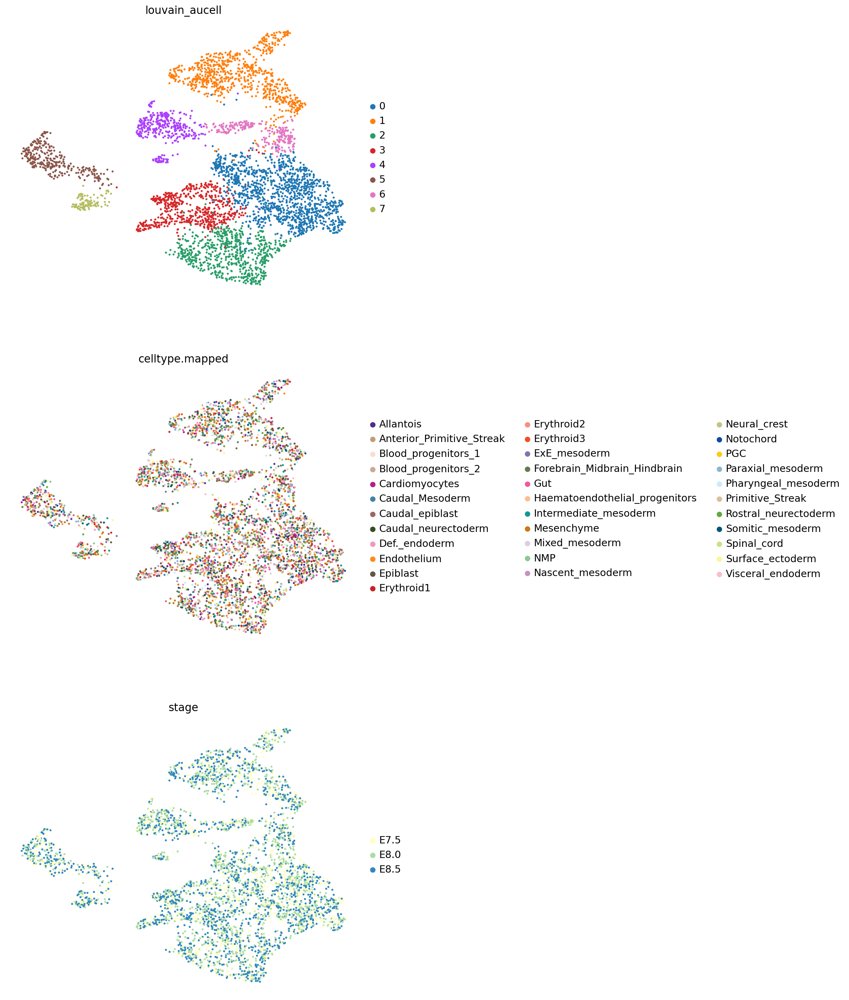

In [27]:
sc.pl.embedding(adata,basis='umap_aucell', color=['louvain_aucell','celltype.mapped','stage'],ncols=1)

In [28]:
def scale(X, x_min, x_max):
    nom = (X - X.min(axis=0)) * (x_max - x_min)
    denom = X.max(axis=0) - X.min(axis=0)
    denom[denom == 0] = 1
    return x_min + nom / denom

In [29]:
X_scaled = scale(adata.X, 0, 1)
adata.X = X_scaled

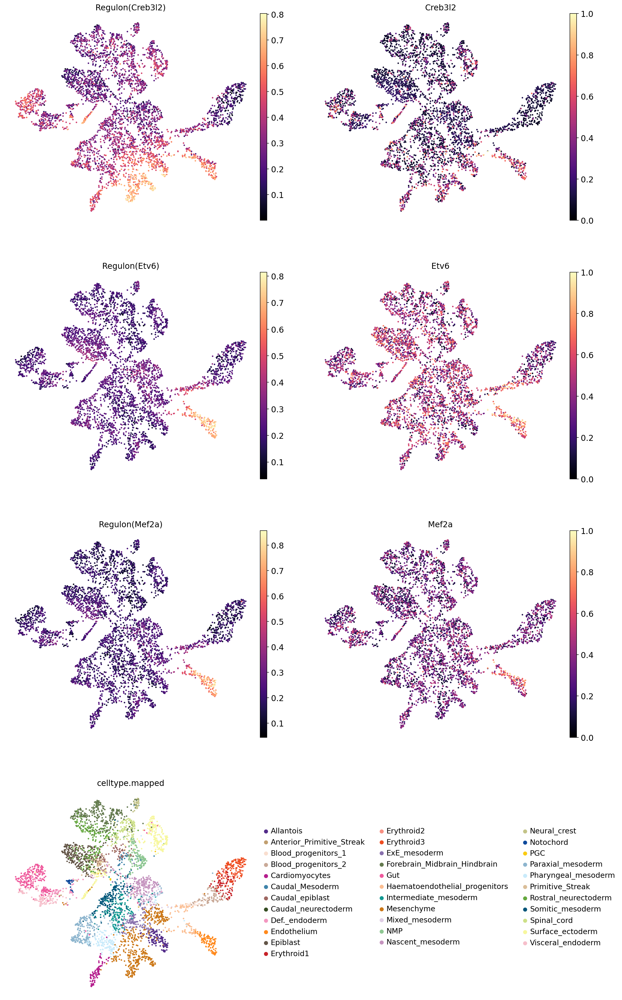

In [30]:
sc.pl.umap(adata,
           color=[
               'Regulon(Creb3l2)', 'Creb3l2', 'Regulon(Etv6)', 'Etv6',
               'Regulon(Mef2a)', 'Mef2a', 'celltype.mapped'
           ],
           color_map='magma',
           ncols=2)  # ,'Regulon(Foxp1)','Foxp1'

In [38]:
io['integrated_adata']= io['outdir']+"/gastrulation_integrated_adata"

'/home/lijingyu/gastrulation/data/gastrulation_multiome_10x/pyscenic'

In [43]:
adata.write(io['integrated_adata'])


# Regulon specificity scores (RSS) across cell types

## Calculate RSS

In [251]:
rss_cellType = regulon_specificity_scores(auc_mtx,
                                          adata.obs['celltype.mapped'])

In [260]:
rss_cellType

,Atf3,Cdx1,Cdx2,Cdx4,Creb3l2,E2f2,Egr2,Elf4,Elk3,En1,...,Tal1,Tbx3,Tcf7l2,Tead1,Tead4,Tfap2a,Trp63,Twist1,Zfp791,Zmat4
Mesenchyme,0.271567,0.273770,0.273445,0.271690,0.275694,0.276260,0.273636,0.274488,0.272523,0.271842,...,0.272919,0.275141,0.276132,0.276959,0.276268,0.273953,0.269926,0.275795,0.276366,0.270603
Nascent_mesoderm,0.230711,0.227991,0.228034,0.227020,0.232416,0.228996,0.230322,0.230269,0.230879,0.231978,...,0.227927,0.230264,0.231000,0.232310,0.231059,0.225279,0.225017,0.228955,0.229053,0.227514
Haematoendothelial_progenitors,0.198101,0.195447,0.194805,0.193738,0.196775,0.198362,0.196733,0.197312,0.196222,0.196420,...,0.197563,0.195315,0.196346,0.196321,0.196066,0.193963,0.194768,0.194180,0.194990,0.195338
Gut,0.236163,0.235904,0.235111,0.236839,0.233256,0.235558,0.234437,0.236762,0.233739,0.234361,...,0.233210,0.232768,0.234989,0.234592,0.236280,0.236223,0.228820,0.231357,0.231354,0.232894
Notochord,0.176779,0.175692,0.175600,0.175008,0.175372,0.178084,0.178635,0.176575,0.175802,0.178545,...,0.176945,0.175569,0.175633,0.175827,0.176430,0.175354,0.174986,0.174748,0.176826,0.177911
Caudal_epiblast,0.195006,0.198412,0.198095,0.197911,0.194605,0.197111,0.196530,0.194533,0.194036,0.195785,...,0.195785,0.193596,0.195933,0.196875,0.196715,0.196573,0.195994,0.193513,0.194230,0.195257
Pharyngeal_mesoderm,0.218701,0.217246,0.216683,0.215276,0.216527,0.217853,0.216707,0.217067,0.217950,0.216762,...,0.216461,0.215304,0.219471,0.218040,0.219183,0.211281,0.213101,0.216940,0.218031,0.216652
Endothelium,0.203116,0.201676,0.201586,0.201003,0.201964,0.203547,0.200850,0.202320,0.204476,0.200593,...,0.205027,0.199832,0.201209,0.202525,0.202536,0.199822,0.197166,0.201529,0.200548,0.199359
Epiblast,0.234693,0.238471,0.238442,0.237666,0.238069,0.236343,0.238345,0.237078,0.236085,0.234941,...,0.235590,0.237193,0.237999,0.238242,0.237902,0.233666,0.232542,0.238021,0.236926,0.237662
ExE_mesoderm,0.205948,0.206667,0.207118,0.207744,0.206599,0.207284,0.209320,0.207604,0.210242,0.208996,...,0.209346,0.206707,0.208337,0.207605,0.207284,0.204289,0.201817,0.209011,0.208662,0.207413


## RSS panel plot with all cell types

In [268]:
cats = sorted(list(set(adata.obs['celltype.mapped'])))[0:9]

fig = plt.figure(figsize=(15, 8))
for c, num in zip(cats, range(1, len(cats) + 1)):
    x = rss_cellType.T[c]
    ax = fig.add_subplot(2, 5, num)
    plot_rss(rss_cellType, c, top_n=5, max_n=None, ax=ax)
    ax.set_ylim(x.min() - (x.max() - x.min()) * 0.05,
                x.max() + (x.max() - x.min()) * 0.05)
    for t in ax.texts:
        t.set_fontsize(12)
    ax.set_ylabel('')
    ax.set_xlabel('')
    adjust_text(ax.texts,
                autoalign='xy',
                ha='right',
                va='bottom',
                arrowprops=dict(arrowstyle='-', color='lightgrey'),
                precision=0.001)

fig.text(0.5, 0.0, 'Regulon', ha='center', va='center', size='x-large')
fig.text(0.00,
         0.5,
         'Regulon specificity score (RSS)',
         ha='center',
         va='center',
         rotation='vertical',
         size='x-large')
plt.tight_layout()
plt.rcParams.update({
    'figure.autolayout': True,
    'figure.titlesize': 'large',
    'axes.labelsize': 'medium',
    'axes.titlesize': 'large',
    'xtick.labelsize': 'medium',
    'ytick.labelsize': 'medium'
})
plt.savefig("cellType-RSS-top5.pdf", dpi=600, bbox_inches="tight")

## Select the top 5 regulons from each cell type

In [253]:
cats = sorted(list(set(adata.obs['celltype.mapped'])))
topreg = []
for i, c in enumerate(cats):
    topreg.extend(
        list(rss_cellType.T[c].sort_values(ascending=False)[:5].index))
topreg = list(set(topreg))

### Generate a Z-score for each regulon to enable comparison between regulons

In [254]:
auc_mtx_Z = pd.DataFrame(index=auc_mtx.index)
for col in list(auc_mtx.columns):
    auc_mtx_Z[col] = (auc_mtx[col] -
                      auc_mtx[col].mean()) / auc_mtx[col].std(ddof=0)
#auc_mtx_Z.sort_index(inplace=True)

### Generate a heatmap

In [255]:
def palplot(pal, names, colors=None, size=1):
    n = len(pal)
    f, ax = plt.subplots(1, 1, figsize=(n * size, size))
    ax.imshow(np.arange(n).reshape(1, n),
              cmap=mpl.colors.ListedColormap(list(pal)),
              interpolation="nearest",
              aspect="auto")
    ax.set_xticks(np.arange(n) - .5)
    ax.set_yticks([-.5, .5])
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    colors = n * ['k'] if colors is None else colors
    for idx, (name, color) in enumerate(zip(names, colors)):
        ax.text(0.0 + idx,
                0.0,
                name,
                color=color,
                horizontalalignment='center',
                verticalalignment='center')
    return f

In [256]:
colors = sns.color_palette('bright', n_colors=len(cats))
colorsd = dict(zip(cats, colors))
colormap = [colorsd[x] for x in adata.obs['celltype.mapped']]

/home/lijingyu/anaconda3/lib/python3.8/site-packages/seaborn/matrix.py:649: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


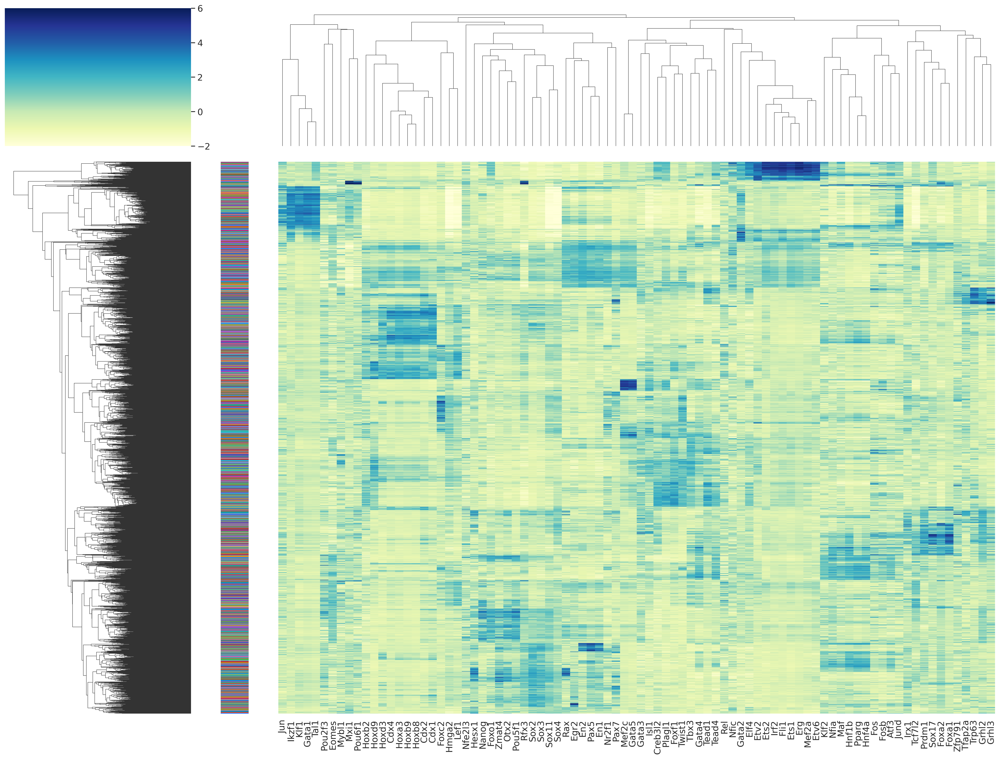

In [265]:
sns.set(font_scale=1.2)
g = sns.clustermap(auc_mtx_Z[topreg],
                   annot=False,
                   square=False,
                   linecolor='gray',
                   yticklabels=False,
                   xticklabels=True,
                   vmin=-2,
                   vmax=6,
                   row_colors=colormap,
                   cmap="YlGnBu",
                   figsize=(21, 16))
g.cax.set_visible(True)
g.ax_heatmap.set_ylabel('')
g.ax_heatmap.set_xlabel('')
plt.savefig("cellType-heatmap-top5.pdf", dpi=600, bbox_inches="tight")